In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt

# Root directory of the project
ROOT_DIR = os.path.abspath("/home/mohamedt/Desktop/WSI_Segmentation/Codes/mask_RCNN")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = "/home/mohamedt/Desktop/WSI_Segmentation/Models/TCGA_maskrcnn/tmp/"

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)
    
import TCGA_nucleus as nucleus # UNCOMMENT ME !!!

Using TensorFlow backend.


Getting image ID's ...
n_training = 106188
n_validation = 1006
Restricting GPU use to 2 GPUs ...
Successfully Restricted GPU use to GPUs: 1, 2


In [2]:
#%% =================================================================
# Configurations
#=================================================================

config = nucleus.NucleusConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     16
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        200
DETECTION_MIN_CONFIDENCE       0
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      2
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 8
IMAGE_MAX_DIM                  128
IMAGE_META_SIZE                20
IMAGE_MIN_DIM                  128
IMAGE_MIN_SCALE                2.0
IMAGE_RESIZE_MODE              crop
IMAGE_SHAPE                    [128 128   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_mask_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'rpn_class_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES  

In [2]:
#%% =================================================================
# Notebook preferences
#=================================================================

def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [3]:
#%% =================================================================
# Dataset
#=================================================================

# Training dataset
dataset_train = nucleus.NucleusDataset()
dataset_train.load_nucleus(subset= "train")
dataset_train.prepare()

# Validation dataset
dataset_val = nucleus.NucleusDataset()
dataset_val.load_nucleus(subset= "val")
dataset_val.prepare()

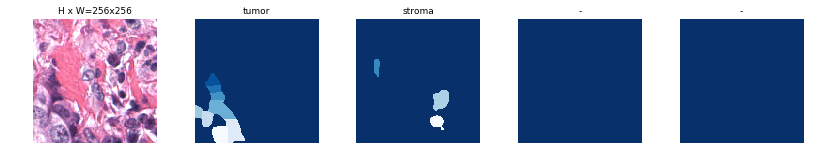

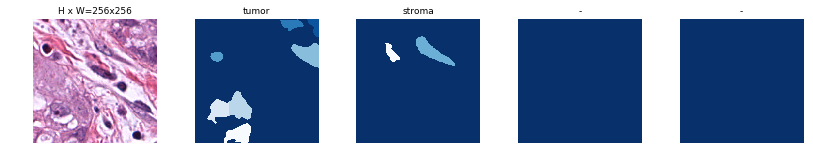

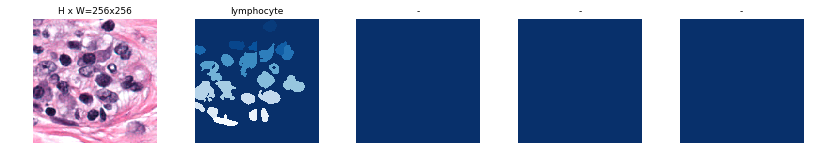

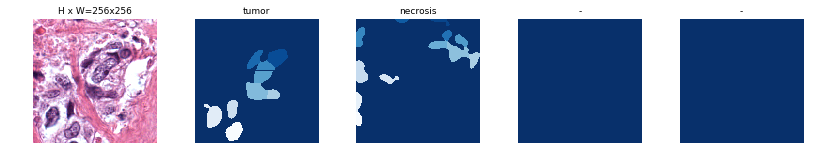

In [4]:
# Load and display random samples
image_ids = np.random.choice(dataset_train.image_ids, 4)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)

In [6]:
#%% =================================================================
# Create model
#=================================================================

# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

In [7]:
# Which weights to start with?
init_with = "coco"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last(), by_name=True)

In [8]:
#%% =================================================================
# Training
#=================================================================

# Train in two stages:
# 1- Only the heads. Here we're freezing all the backbone layers and training 
#    only the randomly initialized layers (i.e. the ones that we didn't use 
#    pre-trained weights from MS COCO). To train only the head layers, 
#    pass layers='heads' to the train() function.
# 2- Fine-tune all layers. For this simple example it's not necessary, 
#    but we're including it to show the process. Simply pass layers="all 
#    to train all layers.

# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.
model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE, 
            epochs=1, 
            layers='heads')


Starting at epoch 0. LR=0.001

Checkpoint Path: /home/mohamedt/Desktop/WSI_Segmentation/Models/TCGA_maskrcnn/tmp/nucleus20180716T1835/mask_rcnn_nucleus_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/tensorflow/python/ops/gradients_impl.py:100: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/keras/engine/training_generator.py:44: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimag

Epoch 1/1


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

  1/236 [..............................] - ETA: 2:37:24 - loss: 6.3714 - rpn_class_loss: 0.4452 - rpn_bbox_loss: 2.0833 - mrcnn_class_loss: 2.3449 - mrcnn_bbox_loss: 0.8869 - mrcnn_mask_loss: 0.6111

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

  2/236 [..............................] - ETA: 1:19:17 - loss: 6.2250 - rpn_class_loss: 0.4177 - rpn_bbox_loss: 1.9954 - mrcnn_class_loss: 2.1943 - mrcnn_bbox_loss: 0.9805 - mrcnn_mask_loss: 0.6370

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

  3/236 [..............................] - ETA: 53:09 - loss: 5.8760 - rpn_class_loss: 0.4103 - rpn_bbox_loss: 1.9825 - mrcnn_class_loss: 1.8218 - mrcnn_bbox_loss: 1.0076 - mrcnn_mask_loss: 0.6538  

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

  4/236 [..............................] - ETA: 40:08 - loss: 5.6274 - rpn_class_loss: 0.4051 - rpn_bbox_loss: 1.9858 - mrcnn_class_loss: 1.5677 - mrcnn_bbox_loss: 1.0069 - mrcnn_mask_loss: 0.6619

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

  5/236 [..............................] - ETA: 32:20 - loss: 5.4972 - rpn_class_loss: 0.4298 - rpn_bbox_loss: 2.0216 - mrcnn_class_loss: 1.4049 - mrcnn_bbox_loss: 0.9825 - mrcnn_mask_loss: 0.6584

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

  6/236 [..............................] - ETA: 27:22 - loss: 5.3335 - rpn_class_loss: 0.4379 - rpn_bbox_loss: 1.9789 - mrcnn_class_loss: 1.3012 - mrcnn_bbox_loss: 0.9620 - mrcnn_mask_loss: 0.6535

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

  7/236 [..............................] - ETA: 23:38 - loss: 5.2202 - rpn_class_loss: 0.4336 - rpn_bbox_loss: 1.9992 - mrcnn_class_loss: 1.1920 - mrcnn_bbox_loss: 0.9454 - mrcnn_mask_loss: 0.6500

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

  8/236 [>.............................] - ETA: 20:48 - loss: 5.0817 - rpn_class_loss: 0.4284 - rpn_bbox_loss: 1.9631 - mrcnn_class_loss: 1.1157 - mrcnn_bbox_loss: 0.9292 - mrcnn_mask_loss: 0.6454

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

  9/236 [>.............................] - ETA: 18:35 - loss: 4.9674 - rpn_class_loss: 0.4199 - rpn_bbox_loss: 1.9322 - mrcnn_class_loss: 1.0535 - mrcnn_bbox_loss: 0.9219 - mrcnn_mask_loss: 0.6399

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 10/236 [>.............................] - ETA: 16:49 - loss: 4.9238 - rpn_class_loss: 0.4256 - rpn_bbox_loss: 1.9097 - mrcnn_class_loss: 1.0319 - mrcnn_bbox_loss: 0.9178 - mrcnn_mask_loss: 0.6388

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 11/236 [>.............................] - ETA: 15:23 - loss: 4.8433 - rpn_class_loss: 0.4187 - rpn_bbox_loss: 1.8756 - mrcnn_class_loss: 0.9999 - mrcnn_bbox_loss: 0.9108 - mrcnn_mask_loss: 0.6383

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 12/236 [>.............................] - ETA: 14:13 - loss: 4.7362 - rpn_class_loss: 0.4162 - rpn_bbox_loss: 1.8281 - mrcnn_class_loss: 0.9507 - mrcnn_bbox_loss: 0.9063 - mrcnn_mask_loss: 0.6350

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 13/236 [>.............................] - ETA: 13:11 - loss: 4.6408 - rpn_class_loss: 0.4043 - rpn_bbox_loss: 1.7912 - mrcnn_class_loss: 0.9134 - mrcnn_bbox_loss: 0.8998 - mrcnn_mask_loss: 0.6320

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 14/236 [>.............................] - ETA: 12:19 - loss: 4.5367 - rpn_class_loss: 0.3912 - rpn_bbox_loss: 1.7492 - mrcnn_class_loss: 0.8757 - mrcnn_bbox_loss: 0.8894 - mrcnn_mask_loss: 0.6312

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 15/236 [>.............................] - ETA: 11:34 - loss: 4.4574 - rpn_class_loss: 0.3828 - rpn_bbox_loss: 1.7172 - mrcnn_class_loss: 0.8488 - mrcnn_bbox_loss: 0.8803 - mrcnn_mask_loss: 0.6284

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 16/236 [=>............................] - ETA: 10:53 - loss: 4.3800 - rpn_class_loss: 0.3727 - rpn_bbox_loss: 1.6891 - mrcnn_class_loss: 0.8142 - mrcnn_bbox_loss: 0.8746 - mrcnn_mask_loss: 0.6293

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 17/236 [=>............................] - ETA: 10:18 - loss: 4.2966 - rpn_class_loss: 0.3626 - rpn_bbox_loss: 1.6501 - mrcnn_class_loss: 0.7836 - mrcnn_bbox_loss: 0.8702 - mrcnn_mask_loss: 0.6301

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 18/236 [=>............................] - ETA: 9:46 - loss: 4.2176 - rpn_class_loss: 0.3539 - rpn_bbox_loss: 1.6155 - mrcnn_class_loss: 0.7566 - mrcnn_bbox_loss: 0.8635 - mrcnn_mask_loss: 0.6280 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 19/236 [=>............................] - ETA: 9:18 - loss: 4.1436 - rpn_class_loss: 0.3463 - rpn_bbox_loss: 1.5818 - mrcnn_class_loss: 0.7319 - mrcnn_bbox_loss: 0.8575 - mrcnn_mask_loss: 0.6260

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 20/236 [=>............................] - ETA: 8:53 - loss: 4.0811 - rpn_class_loss: 0.3394 - rpn_bbox_loss: 1.5554 - mrcnn_class_loss: 0.7088 - mrcnn_bbox_loss: 0.8499 - mrcnn_mask_loss: 0.6276

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 21/236 [=>............................] - ETA: 8:30 - loss: 4.0293 - rpn_class_loss: 0.3312 - rpn_bbox_loss: 1.5399 - mrcnn_class_loss: 0.6872 - mrcnn_bbox_loss: 0.8440 - mrcnn_mask_loss: 0.6270

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 22/236 [=>............................] - ETA: 8:09 - loss: 3.9792 - rpn_class_loss: 0.3239 - rpn_bbox_loss: 1.5262 - mrcnn_class_loss: 0.6677 - mrcnn_bbox_loss: 0.8371 - mrcnn_mask_loss: 0.6244

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 23/236 [=>............................] - ETA: 7:50 - loss: 3.9342 - rpn_class_loss: 0.3181 - rpn_bbox_loss: 1.5093 - mrcnn_class_loss: 0.6511 - mrcnn_bbox_loss: 0.8323 - mrcnn_mask_loss: 0.6236

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 24/236 [==>...........................] - ETA: 7:33 - loss: 3.9011 - rpn_class_loss: 0.3120 - rpn_bbox_loss: 1.4989 - mrcnn_class_loss: 0.6395 - mrcnn_bbox_loss: 0.8278 - mrcnn_mask_loss: 0.6230

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 25/236 [==>...........................] - ETA: 7:16 - loss: 3.8607 - rpn_class_loss: 0.3052 - rpn_bbox_loss: 1.4774 - mrcnn_class_loss: 0.6311 - mrcnn_bbox_loss: 0.8255 - mrcnn_mask_loss: 0.6216

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 26/236 [==>...........................] - ETA: 7:02 - loss: 3.8279 - rpn_class_loss: 0.2989 - rpn_bbox_loss: 1.4616 - mrcnn_class_loss: 0.6266 - mrcnn_bbox_loss: 0.8211 - mrcnn_mask_loss: 0.6198

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 27/236 [==>...........................] - ETA: 6:48 - loss: 3.7994 - rpn_class_loss: 0.2938 - rpn_bbox_loss: 1.4503 - mrcnn_class_loss: 0.6198 - mrcnn_bbox_loss: 0.8172 - mrcnn_mask_loss: 0.6183

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 28/236 [==>...........................] - ETA: 6:35 - loss: 3.7743 - rpn_class_loss: 0.2892 - rpn_bbox_loss: 1.4403 - mrcnn_class_loss: 0.6136 - mrcnn_bbox_loss: 0.8141 - mrcnn_mask_loss: 0.6171

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 29/236 [==>...........................] - ETA: 6:23 - loss: 3.7417 - rpn_class_loss: 0.2849 - rpn_bbox_loss: 1.4259 - mrcnn_class_loss: 0.6053 - mrcnn_bbox_loss: 0.8094 - mrcnn_mask_loss: 0.6163

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 30/236 [==>...........................] - ETA: 6:11 - loss: 3.7149 - rpn_class_loss: 0.2806 - rpn_bbox_loss: 1.4152 - mrcnn_class_loss: 0.5986 - mrcnn_bbox_loss: 0.8068 - mrcnn_mask_loss: 0.6137

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 31/236 [==>...........................] - ETA: 6:01 - loss: 3.6869 - rpn_class_loss: 0.2764 - rpn_bbox_loss: 1.4030 - mrcnn_class_loss: 0.5936 - mrcnn_bbox_loss: 0.8018 - mrcnn_mask_loss: 0.6121

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 32/236 [===>..........................] - ETA: 5:51 - loss: 3.6676 - rpn_class_loss: 0.2728 - rpn_bbox_loss: 1.3967 - mrcnn_class_loss: 0.5883 - mrcnn_bbox_loss: 0.7983 - mrcnn_mask_loss: 0.6115

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 33/236 [===>..........................] - ETA: 5:42 - loss: 3.6496 - rpn_class_loss: 0.2694 - rpn_bbox_loss: 1.3864 - mrcnn_class_loss: 0.5874 - mrcnn_bbox_loss: 0.7957 - mrcnn_mask_loss: 0.6108

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 34/236 [===>..........................] - ETA: 5:33 - loss: 3.6303 - rpn_class_loss: 0.2654 - rpn_bbox_loss: 1.3726 - mrcnn_class_loss: 0.5883 - mrcnn_bbox_loss: 0.7931 - mrcnn_mask_loss: 0.6109

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 35/236 [===>..........................] - ETA: 5:24 - loss: 3.6145 - rpn_class_loss: 0.2616 - rpn_bbox_loss: 1.3681 - mrcnn_class_loss: 0.5851 - mrcnn_bbox_loss: 0.7902 - mrcnn_mask_loss: 0.6094

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 36/236 [===>..........................] - ETA: 5:16 - loss: 3.5988 - rpn_class_loss: 0.2590 - rpn_bbox_loss: 1.3605 - mrcnn_class_loss: 0.5833 - mrcnn_bbox_loss: 0.7878 - mrcnn_mask_loss: 0.6082

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 37/236 [===>..........................] - ETA: 5:08 - loss: 3.5798 - rpn_class_loss: 0.2558 - rpn_bbox_loss: 1.3526 - mrcnn_class_loss: 0.5815 - mrcnn_bbox_loss: 0.7846 - mrcnn_mask_loss: 0.6053

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 38/236 [===>..........................] - ETA: 5:01 - loss: 3.5572 - rpn_class_loss: 0.2517 - rpn_bbox_loss: 1.3409 - mrcnn_class_loss: 0.5805 - mrcnn_bbox_loss: 0.7810 - mrcnn_mask_loss: 0.6031

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 39/236 [===>..........................] - ETA: 4:54 - loss: 3.5520 - rpn_class_loss: 0.2496 - rpn_bbox_loss: 1.3416 - mrcnn_class_loss: 0.5787 - mrcnn_bbox_loss: 0.7796 - mrcnn_mask_loss: 0.6024

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 40/236 [====>.........................] - ETA: 4:47 - loss: 3.5351 - rpn_class_loss: 0.2475 - rpn_bbox_loss: 1.3332 - mrcnn_class_loss: 0.5768 - mrcnn_bbox_loss: 0.7769 - mrcnn_mask_loss: 0.6009

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 41/236 [====>.........................] - ETA: 4:41 - loss: 3.5269 - rpn_class_loss: 0.2452 - rpn_bbox_loss: 1.3356 - mrcnn_class_loss: 0.5723 - mrcnn_bbox_loss: 0.7743 - mrcnn_mask_loss: 0.5996

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 42/236 [====>.........................] - ETA: 4:35 - loss: 3.5162 - rpn_class_loss: 0.2425 - rpn_bbox_loss: 1.3359 - mrcnn_class_loss: 0.5683 - mrcnn_bbox_loss: 0.7715 - mrcnn_mask_loss: 0.5981

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 43/236 [====>.........................] - ETA: 4:29 - loss: 3.5099 - rpn_class_loss: 0.2399 - rpn_bbox_loss: 1.3358 - mrcnn_class_loss: 0.5670 - mrcnn_bbox_loss: 0.7701 - mrcnn_mask_loss: 0.5970

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 44/236 [====>.........................] - ETA: 4:24 - loss: 3.5033 - rpn_class_loss: 0.2373 - rpn_bbox_loss: 1.3394 - mrcnn_class_loss: 0.5634 - mrcnn_bbox_loss: 0.7676 - mrcnn_mask_loss: 0.5957

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 45/236 [====>.........................] - ETA: 4:18 - loss: 3.4897 - rpn_class_loss: 0.2344 - rpn_bbox_loss: 1.3331 - mrcnn_class_loss: 0.5620 - mrcnn_bbox_loss: 0.7659 - mrcnn_mask_loss: 0.5943

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 46/236 [====>.........................] - ETA: 4:13 - loss: 3.4745 - rpn_class_loss: 0.2319 - rpn_bbox_loss: 1.3260 - mrcnn_class_loss: 0.5600 - mrcnn_bbox_loss: 0.7633 - mrcnn_mask_loss: 0.5932

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 47/236 [====>.........................] - ETA: 4:08 - loss: 3.4609 - rpn_class_loss: 0.2298 - rpn_bbox_loss: 1.3203 - mrcnn_class_loss: 0.5584 - mrcnn_bbox_loss: 0.7606 - mrcnn_mask_loss: 0.5919

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 48/236 [=====>........................] - ETA: 4:04 - loss: 3.4503 - rpn_class_loss: 0.2278 - rpn_bbox_loss: 1.3171 - mrcnn_class_loss: 0.5562 - mrcnn_bbox_loss: 0.7585 - mrcnn_mask_loss: 0.5907

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 49/236 [=====>........................] - ETA: 3:59 - loss: 3.4429 - rpn_class_loss: 0.2257 - rpn_bbox_loss: 1.3171 - mrcnn_class_loss: 0.5540 - mrcnn_bbox_loss: 0.7569 - mrcnn_mask_loss: 0.5891

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 50/236 [=====>........................] - ETA: 3:55 - loss: 3.4338 - rpn_class_loss: 0.2235 - rpn_bbox_loss: 1.3127 - mrcnn_class_loss: 0.5536 - mrcnn_bbox_loss: 0.7554 - mrcnn_mask_loss: 0.5886

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 51/236 [=====>........................] - ETA: 3:51 - loss: 3.4204 - rpn_class_loss: 0.2217 - rpn_bbox_loss: 1.3070 - mrcnn_class_loss: 0.5499 - mrcnn_bbox_loss: 0.7545 - mrcnn_mask_loss: 0.5873

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 52/236 [=====>........................] - ETA: 3:47 - loss: 3.4066 - rpn_class_loss: 0.2199 - rpn_bbox_loss: 1.3001 - mrcnn_class_loss: 0.5479 - mrcnn_bbox_loss: 0.7528 - mrcnn_mask_loss: 0.5860

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 53/236 [=====>........................] - ETA: 3:43 - loss: 3.3954 - rpn_class_loss: 0.2184 - rpn_bbox_loss: 1.2958 - mrcnn_class_loss: 0.5457 - mrcnn_bbox_loss: 0.7513 - mrcnn_mask_loss: 0.5842

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


 54/236 [=====>........................] - ETA: 3:39 - loss: 3.3847 - rpn_class_loss: 0.2167 - rpn_bbox_loss: 1.2936 - mrcnn_class_loss: 0.5437 - mrcnn_bbox_loss: 0.7483 - mrcnn_mask_loss: 0.5824

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 55/236 [=====>........................] - ETA: 3:35 - loss: 3.3731 - rpn_class_loss: 0.2151 - rpn_bbox_loss: 1.2870 - mrcnn_class_loss: 0.5417 - mrcnn_bbox_loss: 0.7477 - mrcnn_mask_loss: 0.5816

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 56/236 [======>.......................] - ETA: 3:32 - loss: 3.3607 - rpn_class_loss: 0.2135 - rpn_bbox_loss: 1.2812 - mrcnn_class_loss: 0.5400 - mrcnn_bbox_loss: 0.7453 - mrcnn_mask_loss: 0.5807

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 57/236 [======>.......................] - ETA: 3:28 - loss: 3.3444 - rpn_class_loss: 0.2114 - rpn_bbox_loss: 1.2728 - mrcnn_class_loss: 0.5383 - mrcnn_bbox_loss: 0.7431 - mrcnn_mask_loss: 0.5788

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 58/236 [======>.......................] - ETA: 3:25 - loss: 3.3401 - rpn_class_loss: 0.2099 - rpn_bbox_loss: 1.2737 - mrcnn_class_loss: 0.5378 - mrcnn_bbox_loss: 0.7411 - mrcnn_mask_loss: 0.5776

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 59/236 [======>.......................] - ETA: 3:22 - loss: 3.3325 - rpn_class_loss: 0.2091 - rpn_bbox_loss: 1.2701 - mrcnn_class_loss: 0.5365 - mrcnn_bbox_loss: 0.7401 - mrcnn_mask_loss: 0.5768

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 60/236 [======>.......................] - ETA: 3:19 - loss: 3.3255 - rpn_class_loss: 0.2078 - rpn_bbox_loss: 1.2680 - mrcnn_class_loss: 0.5354 - mrcnn_bbox_loss: 0.7384 - mrcnn_mask_loss: 0.5760

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 61/236 [======>.......................] - ETA: 3:16 - loss: 3.3154 - rpn_class_loss: 0.2064 - rpn_bbox_loss: 1.2645 - mrcnn_class_loss: 0.5333 - mrcnn_bbox_loss: 0.7364 - mrcnn_mask_loss: 0.5749

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 62/236 [======>.......................] - ETA: 3:13 - loss: 3.3086 - rpn_class_loss: 0.2049 - rpn_bbox_loss: 1.2617 - mrcnn_class_loss: 0.5329 - mrcnn_bbox_loss: 0.7348 - mrcnn_mask_loss: 0.5742

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


 63/236 [=======>......................] - ETA: 3:10 - loss: 3.3005 - rpn_class_loss: 0.2036 - rpn_bbox_loss: 1.2592 - mrcnn_class_loss: 0.5321 - mrcnn_bbox_loss: 0.7324 - mrcnn_mask_loss: 0.5732

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 64/236 [=======>......................] - ETA: 3:07 - loss: 3.2925 - rpn_class_loss: 0.2021 - rpn_bbox_loss: 1.2549 - mrcnn_class_loss: 0.5316 - mrcnn_bbox_loss: 0.7311 - mrcnn_mask_loss: 0.5729

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 65/236 [=======>......................] - ETA: 3:04 - loss: 3.2855 - rpn_class_loss: 0.2004 - rpn_bbox_loss: 1.2548 - mrcnn_class_loss: 0.5298 - mrcnn_bbox_loss: 0.7288 - mrcnn_mask_loss: 0.5718

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 66/236 [=======>......................] - ETA: 3:02 - loss: 3.2800 - rpn_class_loss: 0.1992 - rpn_bbox_loss: 1.2531 - mrcnn_class_loss: 0.5302 - mrcnn_bbox_loss: 0.7271 - mrcnn_mask_loss: 0.5705

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 67/236 [=======>......................] - ETA: 2:59 - loss: 3.2721 - rpn_class_loss: 0.1976 - rpn_bbox_loss: 1.2511 - mrcnn_class_loss: 0.5284 - mrcnn_bbox_loss: 0.7257 - mrcnn_mask_loss: 0.5694

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 68/236 [=======>......................] - ETA: 2:56 - loss: 3.2686 - rpn_class_loss: 0.1969 - rpn_bbox_loss: 1.2499 - mrcnn_class_loss: 0.5289 - mrcnn_bbox_loss: 0.7241 - mrcnn_mask_loss: 0.5689

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 69/236 [=======>......................] - ETA: 2:54 - loss: 3.2642 - rpn_class_loss: 0.1962 - rpn_bbox_loss: 1.2502 - mrcnn_class_loss: 0.5279 - mrcnn_bbox_loss: 0.7223 - mrcnn_mask_loss: 0.5676

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 70/236 [=======>......................] - ETA: 2:51 - loss: 3.2552 - rpn_class_loss: 0.1951 - rpn_bbox_loss: 1.2452 - mrcnn_class_loss: 0.5268 - mrcnn_bbox_loss: 0.7209 - mrcnn_mask_loss: 0.5672

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 71/236 [========>.....................] - ETA: 2:49 - loss: 3.2463 - rpn_class_loss: 0.1940 - rpn_bbox_loss: 1.2416 - mrcnn_class_loss: 0.5254 - mrcnn_bbox_loss: 0.7193 - mrcnn_mask_loss: 0.5661

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 72/236 [========>.....................] - ETA: 2:47 - loss: 3.2432 - rpn_class_loss: 0.1929 - rpn_bbox_loss: 1.2408 - mrcnn_class_loss: 0.5255 - mrcnn_bbox_loss: 0.7181 - mrcnn_mask_loss: 0.5658

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 73/236 [========>.....................] - ETA: 2:44 - loss: 3.2377 - rpn_class_loss: 0.1920 - rpn_bbox_loss: 1.2386 - mrcnn_class_loss: 0.5250 - mrcnn_bbox_loss: 0.7168 - mrcnn_mask_loss: 0.5653

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 76/236 [========>.....................] - ETA: 2:38 - loss: 3.2182 - rpn_class_loss: 0.1895 - rpn_bbox_loss: 1.2342 - mrcnn_class_loss: 0.5207 - mrcnn_bbox_loss: 0.7123 - mrcnn_mask_loss: 0.5614

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 77/236 [========>.....................] - ETA: 2:36 - loss: 3.2084 - rpn_class_loss: 0.1885 - rpn_bbox_loss: 1.2312 - mrcnn_class_loss: 0.5182 - mrcnn_bbox_loss: 0.7107 - mrcnn_mask_loss: 0.5598

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 78/236 [========>.....................] - ETA: 2:34 - loss: 3.2015 - rpn_class_loss: 0.1872 - rpn_bbox_loss: 1.2300 - mrcnn_class_loss: 0.5160 - mrcnn_bbox_loss: 0.7096 - mrcnn_mask_loss: 0.5586

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 79/236 [=========>....................] - ETA: 2:32 - loss: 3.1937 - rpn_class_loss: 0.1864 - rpn_bbox_loss: 1.2264 - mrcnn_class_loss: 0.5151 - mrcnn_bbox_loss: 0.7084 - mrcnn_mask_loss: 0.5574

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 80/236 [=========>....................] - ETA: 2:30 - loss: 3.1841 - rpn_class_loss: 0.1852 - rpn_bbox_loss: 1.2219 - mrcnn_class_loss: 0.5132 - mrcnn_bbox_loss: 0.7076 - mrcnn_mask_loss: 0.5563

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 81/236 [=========>....................] - ETA: 2:28 - loss: 3.1807 - rpn_class_loss: 0.1844 - rpn_bbox_loss: 1.2216 - mrcnn_class_loss: 0.5129 - mrcnn_bbox_loss: 0.7066 - mrcnn_mask_loss: 0.5552

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 82/236 [=========>....................] - ETA: 2:26 - loss: 3.1759 - rpn_class_loss: 0.1837 - rpn_bbox_loss: 1.2190 - mrcnn_class_loss: 0.5131 - mrcnn_bbox_loss: 0.7051 - mrcnn_mask_loss: 0.5550

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 83/236 [=========>....................] - ETA: 2:24 - loss: 3.1671 - rpn_class_loss: 0.1828 - rpn_bbox_loss: 1.2171 - mrcnn_class_loss: 0.5113 - mrcnn_bbox_loss: 0.7025 - mrcnn_mask_loss: 0.5533

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 84/236 [=========>....................] - ETA: 2:22 - loss: 3.1622 - rpn_class_loss: 0.1823 - rpn_bbox_loss: 1.2148 - mrcnn_class_loss: 0.5110 - mrcnn_bbox_loss: 0.7012 - mrcnn_mask_loss: 0.5528

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 85/236 [=========>....................] - ETA: 2:20 - loss: 3.1582 - rpn_class_loss: 0.1815 - rpn_bbox_loss: 1.2135 - mrcnn_class_loss: 0.5108 - mrcnn_bbox_loss: 0.7001 - mrcnn_mask_loss: 0.5523

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 86/236 [=========>....................] - ETA: 2:19 - loss: 3.1518 - rpn_class_loss: 0.1804 - rpn_bbox_loss: 1.2106 - mrcnn_class_loss: 0.5107 - mrcnn_bbox_loss: 0.6988 - mrcnn_mask_loss: 0.5513

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 87/236 [==========>...................] - ETA: 2:17 - loss: 3.1439 - rpn_class_loss: 0.1796 - rpn_bbox_loss: 1.2067 - mrcnn_class_loss: 0.5102 - mrcnn_bbox_loss: 0.6971 - mrcnn_mask_loss: 0.5503

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 88/236 [==========>...................] - ETA: 2:15 - loss: 3.1370 - rpn_class_loss: 0.1788 - rpn_bbox_loss: 1.2040 - mrcnn_class_loss: 0.5099 - mrcnn_bbox_loss: 0.6958 - mrcnn_mask_loss: 0.5484

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 89/236 [==========>...................] - ETA: 2:14 - loss: 3.1308 - rpn_class_loss: 0.1780 - rpn_bbox_loss: 1.2013 - mrcnn_class_loss: 0.5093 - mrcnn_bbox_loss: 0.6945 - mrcnn_mask_loss: 0.5478

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 90/236 [==========>...................] - ETA: 2:12 - loss: 3.1272 - rpn_class_loss: 0.1774 - rpn_bbox_loss: 1.2005 - mrcnn_class_loss: 0.5084 - mrcnn_bbox_loss: 0.6939 - mrcnn_mask_loss: 0.5470

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 91/236 [==========>...................] - ETA: 2:10 - loss: 3.1236 - rpn_class_loss: 0.1766 - rpn_bbox_loss: 1.1994 - mrcnn_class_loss: 0.5081 - mrcnn_bbox_loss: 0.6931 - mrcnn_mask_loss: 0.5464

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 92/236 [==========>...................] - ETA: 2:09 - loss: 3.1202 - rpn_class_loss: 0.1756 - rpn_bbox_loss: 1.1978 - mrcnn_class_loss: 0.5084 - mrcnn_bbox_loss: 0.6924 - mrcnn_mask_loss: 0.5459

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 93/236 [==========>...................] - ETA: 2:07 - loss: 3.1178 - rpn_class_loss: 0.1753 - rpn_bbox_loss: 1.1987 - mrcnn_class_loss: 0.5070 - mrcnn_bbox_loss: 0.6920 - mrcnn_mask_loss: 0.5449

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 94/236 [==========>...................] - ETA: 2:06 - loss: 3.1156 - rpn_class_loss: 0.1746 - rpn_bbox_loss: 1.1992 - mrcnn_class_loss: 0.5064 - mrcnn_bbox_loss: 0.6912 - mrcnn_mask_loss: 0.5442

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 95/236 [===========>..................] - ETA: 2:04 - loss: 3.1093 - rpn_class_loss: 0.1741 - rpn_bbox_loss: 1.1970 - mrcnn_class_loss: 0.5050 - mrcnn_bbox_loss: 0.6902 - mrcnn_mask_loss: 0.5431

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 96/236 [===========>..................] - ETA: 2:03 - loss: 3.1021 - rpn_class_loss: 0.1736 - rpn_bbox_loss: 1.1940 - mrcnn_class_loss: 0.5040 - mrcnn_bbox_loss: 0.6887 - mrcnn_mask_loss: 0.5418

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 97/236 [===========>..................] - ETA: 2:01 - loss: 3.0974 - rpn_class_loss: 0.1732 - rpn_bbox_loss: 1.1924 - mrcnn_class_loss: 0.5031 - mrcnn_bbox_loss: 0.6880 - mrcnn_mask_loss: 0.5407

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 98/236 [===========>..................] - ETA: 2:00 - loss: 3.0931 - rpn_class_loss: 0.1726 - rpn_bbox_loss: 1.1902 - mrcnn_class_loss: 0.5028 - mrcnn_bbox_loss: 0.6871 - mrcnn_mask_loss: 0.5405

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

 99/236 [===========>..................] - ETA: 1:58 - loss: 3.0889 - rpn_class_loss: 0.1719 - rpn_bbox_loss: 1.1880 - mrcnn_class_loss: 0.5024 - mrcnn_bbox_loss: 0.6861 - mrcnn_mask_loss: 0.5405

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

100/236 [===========>..................] - ETA: 1:57 - loss: 3.0841 - rpn_class_loss: 0.1714 - rpn_bbox_loss: 1.1847 - mrcnn_class_loss: 0.5024 - mrcnn_bbox_loss: 0.6859 - mrcnn_mask_loss: 0.5397

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

101/236 [===========>..................] - ETA: 1:55 - loss: 3.0802 - rpn_class_loss: 0.1711 - rpn_bbox_loss: 1.1819 - mrcnn_class_loss: 0.5022 - mrcnn_bbox_loss: 0.6860 - mrcnn_mask_loss: 0.5390

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

102/236 [===========>..................] - ETA: 1:54 - loss: 3.0771 - rpn_class_loss: 0.1709 - rpn_bbox_loss: 1.1804 - mrcnn_class_loss: 0.5019 - mrcnn_bbox_loss: 0.6853 - mrcnn_mask_loss: 0.5386

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

103/236 [============>.................] - ETA: 1:53 - loss: 3.0729 - rpn_class_loss: 0.1702 - rpn_bbox_loss: 1.1778 - mrcnn_class_loss: 0.5017 - mrcnn_bbox_loss: 0.6850 - mrcnn_mask_loss: 0.5382

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

104/236 [============>.................] - ETA: 1:51 - loss: 3.0677 - rpn_class_loss: 0.1698 - rpn_bbox_loss: 1.1753 - mrcnn_class_loss: 0.5010 - mrcnn_bbox_loss: 0.6837 - mrcnn_mask_loss: 0.5378

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

105/236 [============>.................] - ETA: 1:50 - loss: 3.0666 - rpn_class_loss: 0.1694 - rpn_bbox_loss: 1.1768 - mrcnn_class_loss: 0.5006 - mrcnn_bbox_loss: 0.6830 - mrcnn_mask_loss: 0.5368

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

106/236 [============>.................] - ETA: 1:49 - loss: 3.0609 - rpn_class_loss: 0.1688 - rpn_bbox_loss: 1.1743 - mrcnn_class_loss: 0.4999 - mrcnn_bbox_loss: 0.6822 - mrcnn_mask_loss: 0.5357

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

107/236 [============>.................] - ETA: 1:47 - loss: 3.0564 - rpn_class_loss: 0.1686 - rpn_bbox_loss: 1.1723 - mrcnn_class_loss: 0.4985 - mrcnn_bbox_loss: 0.6818 - mrcnn_mask_loss: 0.5353

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

108/236 [============>.................] - ETA: 1:46 - loss: 3.0517 - rpn_class_loss: 0.1682 - rpn_bbox_loss: 1.1714 - mrcnn_class_loss: 0.4966 - mrcnn_bbox_loss: 0.6810 - mrcnn_mask_loss: 0.5344

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

109/236 [============>.................] - ETA: 1:45 - loss: 3.0472 - rpn_class_loss: 0.1676 - rpn_bbox_loss: 1.1693 - mrcnn_class_loss: 0.4966 - mrcnn_bbox_loss: 0.6802 - mrcnn_mask_loss: 0.5334

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

110/236 [============>.................] - ETA: 1:44 - loss: 3.0441 - rpn_class_loss: 0.1672 - rpn_bbox_loss: 1.1685 - mrcnn_class_loss: 0.4965 - mrcnn_bbox_loss: 0.6795 - mrcnn_mask_loss: 0.5325

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

111/236 [=============>................] - ETA: 1:42 - loss: 3.0410 - rpn_class_loss: 0.1669 - rpn_bbox_loss: 1.1674 - mrcnn_class_loss: 0.4962 - mrcnn_bbox_loss: 0.6791 - mrcnn_mask_loss: 0.5314

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

112/236 [=============>................] - ETA: 1:41 - loss: 3.0371 - rpn_class_loss: 0.1664 - rpn_bbox_loss: 1.1667 - mrcnn_class_loss: 0.4951 - mrcnn_bbox_loss: 0.6784 - mrcnn_mask_loss: 0.5304

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

113/236 [=============>................] - ETA: 1:40 - loss: 3.0306 - rpn_class_loss: 0.1658 - rpn_bbox_loss: 1.1636 - mrcnn_class_loss: 0.4946 - mrcnn_bbox_loss: 0.6775 - mrcnn_mask_loss: 0.5291

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

114/236 [=============>................] - ETA: 1:39 - loss: 3.0259 - rpn_class_loss: 0.1654 - rpn_bbox_loss: 1.1613 - mrcnn_class_loss: 0.4938 - mrcnn_bbox_loss: 0.6769 - mrcnn_mask_loss: 0.5286

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

115/236 [=============>................] - ETA: 1:38 - loss: 3.0232 - rpn_class_loss: 0.1648 - rpn_bbox_loss: 1.1601 - mrcnn_class_loss: 0.4938 - mrcnn_bbox_loss: 0.6764 - mrcnn_mask_loss: 0.5282

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

116/236 [=============>................] - ETA: 1:36 - loss: 3.0185 - rpn_class_loss: 0.1640 - rpn_bbox_loss: 1.1591 - mrcnn_class_loss: 0.4925 - mrcnn_bbox_loss: 0.6760 - mrcnn_mask_loss: 0.5269

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

117/236 [=============>................] - ETA: 1:35 - loss: 3.0158 - rpn_class_loss: 0.1635 - rpn_bbox_loss: 1.1591 - mrcnn_class_loss: 0.4914 - mrcnn_bbox_loss: 0.6754 - mrcnn_mask_loss: 0.5265

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

118/236 [==============>...............] - ETA: 1:34 - loss: 3.0135 - rpn_class_loss: 0.1630 - rpn_bbox_loss: 1.1591 - mrcnn_class_loss: 0.4910 - mrcnn_bbox_loss: 0.6746 - mrcnn_mask_loss: 0.5258

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

119/236 [==============>...............] - ETA: 1:33 - loss: 3.0082 - rpn_class_loss: 0.1623 - rpn_bbox_loss: 1.1570 - mrcnn_class_loss: 0.4901 - mrcnn_bbox_loss: 0.6740 - mrcnn_mask_loss: 0.5248

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

120/236 [==============>...............] - ETA: 1:32 - loss: 3.0053 - rpn_class_loss: 0.1622 - rpn_bbox_loss: 1.1564 - mrcnn_class_loss: 0.4894 - mrcnn_bbox_loss: 0.6730 - mrcnn_mask_loss: 0.5243

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

121/236 [==============>...............] - ETA: 1:31 - loss: 3.0015 - rpn_class_loss: 0.1616 - rpn_bbox_loss: 1.1552 - mrcnn_class_loss: 0.4890 - mrcnn_bbox_loss: 0.6723 - mrcnn_mask_loss: 0.5235

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

122/236 [==============>...............] - ETA: 1:30 - loss: 2.9988 - rpn_class_loss: 0.1613 - rpn_bbox_loss: 1.1551 - mrcnn_class_loss: 0.4882 - mrcnn_bbox_loss: 0.6713 - mrcnn_mask_loss: 0.5229

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

123/236 [==============>...............] - ETA: 1:29 - loss: 2.9954 - rpn_class_loss: 0.1611 - rpn_bbox_loss: 1.1545 - mrcnn_class_loss: 0.4878 - mrcnn_bbox_loss: 0.6703 - mrcnn_mask_loss: 0.5217

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

124/236 [==============>...............] - ETA: 1:27 - loss: 2.9937 - rpn_class_loss: 0.1610 - rpn_bbox_loss: 1.1542 - mrcnn_class_loss: 0.4880 - mrcnn_bbox_loss: 0.6694 - mrcnn_mask_loss: 0.5210

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

125/236 [==============>...............] - ETA: 1:26 - loss: 2.9914 - rpn_class_loss: 0.1606 - rpn_bbox_loss: 1.1537 - mrcnn_class_loss: 0.4876 - mrcnn_bbox_loss: 0.6689 - mrcnn_mask_loss: 0.5206

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

126/236 [===============>..............] - ETA: 1:25 - loss: 2.9900 - rpn_class_loss: 0.1602 - rpn_bbox_loss: 1.1550 - mrcnn_class_loss: 0.4865 - mrcnn_bbox_loss: 0.6682 - mrcnn_mask_loss: 0.5201

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

127/236 [===============>..............] - ETA: 1:24 - loss: 2.9878 - rpn_class_loss: 0.1597 - rpn_bbox_loss: 1.1545 - mrcnn_class_loss: 0.4867 - mrcnn_bbox_loss: 0.6674 - mrcnn_mask_loss: 0.5196

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

128/236 [===============>..............] - ETA: 1:23 - loss: 2.9852 - rpn_class_loss: 0.1593 - rpn_bbox_loss: 1.1542 - mrcnn_class_loss: 0.4859 - mrcnn_bbox_loss: 0.6670 - mrcnn_mask_loss: 0.5187

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

129/236 [===============>..............] - ETA: 1:22 - loss: 2.9808 - rpn_class_loss: 0.1588 - rpn_bbox_loss: 1.1538 - mrcnn_class_loss: 0.4847 - mrcnn_bbox_loss: 0.6659 - mrcnn_mask_loss: 0.5176

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

130/236 [===============>..............] - ETA: 1:21 - loss: 2.9754 - rpn_class_loss: 0.1583 - rpn_bbox_loss: 1.1515 - mrcnn_class_loss: 0.4839 - mrcnn_bbox_loss: 0.6649 - mrcnn_mask_loss: 0.5168

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

131/236 [===============>..............] - ETA: 1:20 - loss: 2.9741 - rpn_class_loss: 0.1579 - rpn_bbox_loss: 1.1510 - mrcnn_class_loss: 0.4835 - mrcnn_bbox_loss: 0.6648 - mrcnn_mask_loss: 0.5169

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

132/236 [===============>..............] - ETA: 1:19 - loss: 2.9718 - rpn_class_loss: 0.1576 - rpn_bbox_loss: 1.1500 - mrcnn_class_loss: 0.4836 - mrcnn_bbox_loss: 0.6644 - mrcnn_mask_loss: 0.5163

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

133/236 [===============>..............] - ETA: 1:18 - loss: 2.9686 - rpn_class_loss: 0.1572 - rpn_bbox_loss: 1.1490 - mrcnn_class_loss: 0.4832 - mrcnn_bbox_loss: 0.6639 - mrcnn_mask_loss: 0.5153

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

134/236 [================>.............] - ETA: 1:17 - loss: 2.9629 - rpn_class_loss: 0.1568 - rpn_bbox_loss: 1.1467 - mrcnn_class_loss: 0.4822 - mrcnn_bbox_loss: 0.6629 - mrcnn_mask_loss: 0.5143

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

135/236 [================>.............] - ETA: 1:16 - loss: 2.9589 - rpn_class_loss: 0.1565 - rpn_bbox_loss: 1.1452 - mrcnn_class_loss: 0.4814 - mrcnn_bbox_loss: 0.6623 - mrcnn_mask_loss: 0.5135

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

136/236 [================>.............] - ETA: 1:15 - loss: 2.9537 - rpn_class_loss: 0.1559 - rpn_bbox_loss: 1.1434 - mrcnn_class_loss: 0.4804 - mrcnn_bbox_loss: 0.6613 - mrcnn_mask_loss: 0.5128

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

137/236 [================>.............] - ETA: 1:14 - loss: 2.9516 - rpn_class_loss: 0.1558 - rpn_bbox_loss: 1.1443 - mrcnn_class_loss: 0.4794 - mrcnn_bbox_loss: 0.6604 - mrcnn_mask_loss: 0.5118

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

138/236 [================>.............] - ETA: 1:13 - loss: 2.9488 - rpn_class_loss: 0.1555 - rpn_bbox_loss: 1.1434 - mrcnn_class_loss: 0.4793 - mrcnn_bbox_loss: 0.6594 - mrcnn_mask_loss: 0.5111

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

139/236 [================>.............] - ETA: 1:12 - loss: 2.9449 - rpn_class_loss: 0.1552 - rpn_bbox_loss: 1.1426 - mrcnn_class_loss: 0.4780 - mrcnn_bbox_loss: 0.6587 - mrcnn_mask_loss: 0.5103

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

140/236 [================>.............] - ETA: 1:11 - loss: 2.9406 - rpn_class_loss: 0.1547 - rpn_bbox_loss: 1.1412 - mrcnn_class_loss: 0.4771 - mrcnn_bbox_loss: 0.6582 - mrcnn_mask_loss: 0.5093

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

141/236 [================>.............] - ETA: 1:10 - loss: 2.9409 - rpn_class_loss: 0.1546 - rpn_bbox_loss: 1.1403 - mrcnn_class_loss: 0.4786 - mrcnn_bbox_loss: 0.6582 - mrcnn_mask_loss: 0.5092

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

142/236 [=================>............] - ETA: 1:09 - loss: 2.9372 - rpn_class_loss: 0.1542 - rpn_bbox_loss: 1.1392 - mrcnn_class_loss: 0.4780 - mrcnn_bbox_loss: 0.6572 - mrcnn_mask_loss: 0.5085

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

143/236 [=================>............] - ETA: 1:09 - loss: 2.9338 - rpn_class_loss: 0.1537 - rpn_bbox_loss: 1.1372 - mrcnn_class_loss: 0.4780 - mrcnn_bbox_loss: 0.6566 - mrcnn_mask_loss: 0.5083

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

144/236 [=================>............] - ETA: 1:08 - loss: 2.9320 - rpn_class_loss: 0.1535 - rpn_bbox_loss: 1.1356 - mrcnn_class_loss: 0.4787 - mrcnn_bbox_loss: 0.6563 - mrcnn_mask_loss: 0.5080

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

145/236 [=================>............] - ETA: 1:07 - loss: 2.9272 - rpn_class_loss: 0.1531 - rpn_bbox_loss: 1.1332 - mrcnn_class_loss: 0.4779 - mrcnn_bbox_loss: 0.6555 - mrcnn_mask_loss: 0.5075

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

146/236 [=================>............] - ETA: 1:06 - loss: 2.9251 - rpn_class_loss: 0.1528 - rpn_bbox_loss: 1.1323 - mrcnn_class_loss: 0.4781 - mrcnn_bbox_loss: 0.6547 - mrcnn_mask_loss: 0.5072

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

147/236 [=================>............] - ETA: 1:05 - loss: 2.9227 - rpn_class_loss: 0.1526 - rpn_bbox_loss: 1.1318 - mrcnn_class_loss: 0.4782 - mrcnn_bbox_loss: 0.6536 - mrcnn_mask_loss: 0.5065

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

148/236 [=================>............] - ETA: 1:04 - loss: 2.9208 - rpn_class_loss: 0.1524 - rpn_bbox_loss: 1.1312 - mrcnn_class_loss: 0.4781 - mrcnn_bbox_loss: 0.6534 - mrcnn_mask_loss: 0.5057

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

149/236 [=================>............] - ETA: 1:03 - loss: 2.9172 - rpn_class_loss: 0.1521 - rpn_bbox_loss: 1.1301 - mrcnn_class_loss: 0.4774 - mrcnn_bbox_loss: 0.6528 - mrcnn_mask_loss: 0.5047

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

150/236 [==================>...........] - ETA: 1:02 - loss: 2.9130 - rpn_class_loss: 0.1517 - rpn_bbox_loss: 1.1281 - mrcnn_class_loss: 0.4769 - mrcnn_bbox_loss: 0.6523 - mrcnn_mask_loss: 0.5040

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

151/236 [==================>...........] - ETA: 1:01 - loss: 2.9105 - rpn_class_loss: 0.1513 - rpn_bbox_loss: 1.1275 - mrcnn_class_loss: 0.4765 - mrcnn_bbox_loss: 0.6518 - mrcnn_mask_loss: 0.5034

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

152/236 [==================>...........] - ETA: 1:00 - loss: 2.9088 - rpn_class_loss: 0.1512 - rpn_bbox_loss: 1.1264 - mrcnn_class_loss: 0.4771 - mrcnn_bbox_loss: 0.6514 - mrcnn_mask_loss: 0.5027

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

153/236 [==================>...........] - ETA: 1:00 - loss: 2.9074 - rpn_class_loss: 0.1510 - rpn_bbox_loss: 1.1260 - mrcnn_class_loss: 0.4768 - mrcnn_bbox_loss: 0.6513 - mrcnn_mask_loss: 0.5022

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

154/236 [==================>...........] - ETA: 59s - loss: 2.9063 - rpn_class_loss: 0.1508 - rpn_bbox_loss: 1.1260 - mrcnn_class_loss: 0.4767 - mrcnn_bbox_loss: 0.6510 - mrcnn_mask_loss: 0.5018 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

155/236 [==================>...........] - ETA: 58s - loss: 2.9040 - rpn_class_loss: 0.1506 - rpn_bbox_loss: 1.1255 - mrcnn_class_loss: 0.4761 - mrcnn_bbox_loss: 0.6503 - mrcnn_mask_loss: 0.5015

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

156/236 [==================>...........] - ETA: 57s - loss: 2.8990 - rpn_class_loss: 0.1503 - rpn_bbox_loss: 1.1240 - mrcnn_class_loss: 0.4748 - mrcnn_bbox_loss: 0.6494 - mrcnn_mask_loss: 0.5006

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

157/236 [==================>...........] - ETA: 56s - loss: 2.8964 - rpn_class_loss: 0.1501 - rpn_bbox_loss: 1.1229 - mrcnn_class_loss: 0.4744 - mrcnn_bbox_loss: 0.6491 - mrcnn_mask_loss: 0.5000

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

158/236 [===================>..........] - ETA: 55s - loss: 2.8927 - rpn_class_loss: 0.1497 - rpn_bbox_loss: 1.1216 - mrcnn_class_loss: 0.4739 - mrcnn_bbox_loss: 0.6482 - mrcnn_mask_loss: 0.4992

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

159/236 [===================>..........] - ETA: 55s - loss: 2.8890 - rpn_class_loss: 0.1493 - rpn_bbox_loss: 1.1206 - mrcnn_class_loss: 0.4734 - mrcnn_bbox_loss: 0.6474 - mrcnn_mask_loss: 0.4983

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

160/236 [===================>..........] - ETA: 54s - loss: 2.8840 - rpn_class_loss: 0.1490 - rpn_bbox_loss: 1.1184 - mrcnn_class_loss: 0.4726 - mrcnn_bbox_loss: 0.6465 - mrcnn_mask_loss: 0.4976

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

161/236 [===================>..........] - ETA: 54s - loss: 2.8811 - rpn_class_loss: 0.1486 - rpn_bbox_loss: 1.1180 - mrcnn_class_loss: 0.4717 - mrcnn_bbox_loss: 0.6457 - mrcnn_mask_loss: 0.4970

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

162/236 [===================>..........] - ETA: 53s - loss: 2.8786 - rpn_class_loss: 0.1483 - rpn_bbox_loss: 1.1170 - mrcnn_class_loss: 0.4712 - mrcnn_bbox_loss: 0.6455 - mrcnn_mask_loss: 0.4966

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

163/236 [===================>..........] - ETA: 52s - loss: 2.8769 - rpn_class_loss: 0.1482 - rpn_bbox_loss: 1.1164 - mrcnn_class_loss: 0.4706 - mrcnn_bbox_loss: 0.6456 - mrcnn_mask_loss: 0.4962

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

164/236 [===================>..........] - ETA: 52s - loss: 2.8738 - rpn_class_loss: 0.1479 - rpn_bbox_loss: 1.1149 - mrcnn_class_loss: 0.4700 - mrcnn_bbox_loss: 0.6452 - mrcnn_mask_loss: 0.4958

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

165/236 [===================>..........] - ETA: 51s - loss: 2.8714 - rpn_class_loss: 0.1477 - rpn_bbox_loss: 1.1139 - mrcnn_class_loss: 0.4694 - mrcnn_bbox_loss: 0.6449 - mrcnn_mask_loss: 0.4955

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

166/236 [====================>.........] - ETA: 50s - loss: 2.8684 - rpn_class_loss: 0.1475 - rpn_bbox_loss: 1.1135 - mrcnn_class_loss: 0.4686 - mrcnn_bbox_loss: 0.6440 - mrcnn_mask_loss: 0.4949

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

167/236 [====================>.........] - ETA: 49s - loss: 2.8652 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 1.1118 - mrcnn_class_loss: 0.4682 - mrcnn_bbox_loss: 0.6435 - mrcnn_mask_loss: 0.4945

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

168/236 [====================>.........] - ETA: 48s - loss: 2.8626 - rpn_class_loss: 0.1469 - rpn_bbox_loss: 1.1110 - mrcnn_class_loss: 0.4676 - mrcnn_bbox_loss: 0.6430 - mrcnn_mask_loss: 0.4941

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

169/236 [====================>.........] - ETA: 47s - loss: 2.8587 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 1.1093 - mrcnn_class_loss: 0.4671 - mrcnn_bbox_loss: 0.6422 - mrcnn_mask_loss: 0.4934

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

170/236 [====================>.........] - ETA: 47s - loss: 2.8554 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 1.1078 - mrcnn_class_loss: 0.4666 - mrcnn_bbox_loss: 0.6417 - mrcnn_mask_loss: 0.4930

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

171/236 [====================>.........] - ETA: 46s - loss: 2.8536 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 1.1072 - mrcnn_class_loss: 0.4662 - mrcnn_bbox_loss: 0.6415 - mrcnn_mask_loss: 0.4927

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

172/236 [====================>.........] - ETA: 45s - loss: 2.8510 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 1.1070 - mrcnn_class_loss: 0.4653 - mrcnn_bbox_loss: 0.6409 - mrcnn_mask_loss: 0.4920

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

173/236 [====================>.........] - ETA: 45s - loss: 2.8473 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 1.1052 - mrcnn_class_loss: 0.4647 - mrcnn_bbox_loss: 0.6403 - mrcnn_mask_loss: 0.4916

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

174/236 [=====================>........] - ETA: 44s - loss: 2.8447 - rpn_class_loss: 0.1453 - rpn_bbox_loss: 1.1039 - mrcnn_class_loss: 0.4646 - mrcnn_bbox_loss: 0.6398 - mrcnn_mask_loss: 0.4912

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

175/236 [=====================>........] - ETA: 44s - loss: 2.8419 - rpn_class_loss: 0.1451 - rpn_bbox_loss: 1.1024 - mrcnn_class_loss: 0.4643 - mrcnn_bbox_loss: 0.6394 - mrcnn_mask_loss: 0.4907

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

176/236 [=====================>........] - ETA: 43s - loss: 2.8405 - rpn_class_loss: 0.1447 - rpn_bbox_loss: 1.1010 - mrcnn_class_loss: 0.4650 - mrcnn_bbox_loss: 0.6391 - mrcnn_mask_loss: 0.4907

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

177/236 [=====================>........] - ETA: 42s - loss: 2.8403 - rpn_class_loss: 0.1445 - rpn_bbox_loss: 1.1013 - mrcnn_class_loss: 0.4650 - mrcnn_bbox_loss: 0.6386 - mrcnn_mask_loss: 0.4908

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

178/236 [=====================>........] - ETA: 41s - loss: 2.8378 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 1.0998 - mrcnn_class_loss: 0.4652 - mrcnn_bbox_loss: 0.6382 - mrcnn_mask_loss: 0.4902

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

179/236 [=====================>........] - ETA: 40s - loss: 2.8357 - rpn_class_loss: 0.1441 - rpn_bbox_loss: 1.0992 - mrcnn_class_loss: 0.4650 - mrcnn_bbox_loss: 0.6377 - mrcnn_mask_loss: 0.4896

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

180/236 [=====================>........] - ETA: 40s - loss: 2.8334 - rpn_class_loss: 0.1439 - rpn_bbox_loss: 1.0985 - mrcnn_class_loss: 0.4645 - mrcnn_bbox_loss: 0.6374 - mrcnn_mask_loss: 0.4890

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

181/236 [======================>.......] - ETA: 39s - loss: 2.8308 - rpn_class_loss: 0.1438 - rpn_bbox_loss: 1.0983 - mrcnn_class_loss: 0.4638 - mrcnn_bbox_loss: 0.6365 - mrcnn_mask_loss: 0.4884

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

182/236 [======================>.......] - ETA: 38s - loss: 2.8297 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 1.0985 - mrcnn_class_loss: 0.4637 - mrcnn_bbox_loss: 0.6359 - mrcnn_mask_loss: 0.4880

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

183/236 [======================>.......] - ETA: 37s - loss: 2.8271 - rpn_class_loss: 0.1432 - rpn_bbox_loss: 1.0977 - mrcnn_class_loss: 0.4628 - mrcnn_bbox_loss: 0.6354 - mrcnn_mask_loss: 0.4880

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

184/236 [======================>.......] - ETA: 36s - loss: 2.8231 - rpn_class_loss: 0.1430 - rpn_bbox_loss: 1.0955 - mrcnn_class_loss: 0.4628 - mrcnn_bbox_loss: 0.6344 - mrcnn_mask_loss: 0.4874

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

185/236 [======================>.......] - ETA: 36s - loss: 2.8201 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 1.0945 - mrcnn_class_loss: 0.4624 - mrcnn_bbox_loss: 0.6337 - mrcnn_mask_loss: 0.4867

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


186/236 [======================>.......] - ETA: 36s - loss: 2.8168 - rpn_class_loss: 0.1425 - rpn_bbox_loss: 1.0933 - mrcnn_class_loss: 0.4619 - mrcnn_bbox_loss: 0.6331 - mrcnn_mask_loss: 0.4861

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

187/236 [======================>.......] - ETA: 35s - loss: 2.8141 - rpn_class_loss: 0.1422 - rpn_bbox_loss: 1.0928 - mrcnn_class_loss: 0.4612 - mrcnn_bbox_loss: 0.6324 - mrcnn_mask_loss: 0.4854

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

188/236 [======================>.......] - ETA: 34s - loss: 2.8125 - rpn_class_loss: 0.1420 - rpn_bbox_loss: 1.0928 - mrcnn_class_loss: 0.4606 - mrcnn_bbox_loss: 0.6320 - mrcnn_mask_loss: 0.4851

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

189/236 [=======================>......] - ETA: 33s - loss: 2.8114 - rpn_class_loss: 0.1420 - rpn_bbox_loss: 1.0933 - mrcnn_class_loss: 0.4605 - mrcnn_bbox_loss: 0.6312 - mrcnn_mask_loss: 0.4845

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

190/236 [=======================>......] - ETA: 33s - loss: 2.8102 - rpn_class_loss: 0.1418 - rpn_bbox_loss: 1.0931 - mrcnn_class_loss: 0.4601 - mrcnn_bbox_loss: 0.6312 - mrcnn_mask_loss: 0.4839

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

191/236 [=======================>......] - ETA: 32s - loss: 2.8079 - rpn_class_loss: 0.1415 - rpn_bbox_loss: 1.0917 - mrcnn_class_loss: 0.4601 - mrcnn_bbox_loss: 0.6310 - mrcnn_mask_loss: 0.4835

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

192/236 [=======================>......] - ETA: 31s - loss: 2.8053 - rpn_class_loss: 0.1413 - rpn_bbox_loss: 1.0905 - mrcnn_class_loss: 0.4603 - mrcnn_bbox_loss: 0.6303 - mrcnn_mask_loss: 0.4829

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

193/236 [=======================>......] - ETA: 30s - loss: 2.8034 - rpn_class_loss: 0.1411 - rpn_bbox_loss: 1.0900 - mrcnn_class_loss: 0.4601 - mrcnn_bbox_loss: 0.6299 - mrcnn_mask_loss: 0.4823

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

194/236 [=======================>......] - ETA: 30s - loss: 2.8023 - rpn_class_loss: 0.1411 - rpn_bbox_loss: 1.0905 - mrcnn_class_loss: 0.4592 - mrcnn_bbox_loss: 0.6297 - mrcnn_mask_loss: 0.4818

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

195/236 [=======================>......] - ETA: 29s - loss: 2.8010 - rpn_class_loss: 0.1410 - rpn_bbox_loss: 1.0900 - mrcnn_class_loss: 0.4590 - mrcnn_bbox_loss: 0.6294 - mrcnn_mask_loss: 0.4815

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

196/236 [=======================>......] - ETA: 28s - loss: 2.7989 - rpn_class_loss: 0.1409 - rpn_bbox_loss: 1.0892 - mrcnn_class_loss: 0.4587 - mrcnn_bbox_loss: 0.6291 - mrcnn_mask_loss: 0.4811

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

197/236 [========================>.....] - ETA: 28s - loss: 2.7972 - rpn_class_loss: 0.1406 - rpn_bbox_loss: 1.0892 - mrcnn_class_loss: 0.4582 - mrcnn_bbox_loss: 0.6286 - mrcnn_mask_loss: 0.4805

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

198/236 [========================>.....] - ETA: 27s - loss: 2.7949 - rpn_class_loss: 0.1404 - rpn_bbox_loss: 1.0885 - mrcnn_class_loss: 0.4579 - mrcnn_bbox_loss: 0.6281 - mrcnn_mask_loss: 0.4801

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

199/236 [========================>.....] - ETA: 26s - loss: 2.7924 - rpn_class_loss: 0.1401 - rpn_bbox_loss: 1.0873 - mrcnn_class_loss: 0.4578 - mrcnn_bbox_loss: 0.6277 - mrcnn_mask_loss: 0.4794

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

200/236 [========================>.....] - ETA: 25s - loss: 2.7908 - rpn_class_loss: 0.1400 - rpn_bbox_loss: 1.0869 - mrcnn_class_loss: 0.4577 - mrcnn_bbox_loss: 0.6272 - mrcnn_mask_loss: 0.4791

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

201/236 [========================>.....] - ETA: 25s - loss: 2.7887 - rpn_class_loss: 0.1398 - rpn_bbox_loss: 1.0856 - mrcnn_class_loss: 0.4579 - mrcnn_bbox_loss: 0.6270 - mrcnn_mask_loss: 0.4785

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

202/236 [========================>.....] - ETA: 24s - loss: 2.7874 - rpn_class_loss: 0.1396 - rpn_bbox_loss: 1.0858 - mrcnn_class_loss: 0.4577 - mrcnn_bbox_loss: 0.6264 - mrcnn_mask_loss: 0.4779

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

203/236 [========================>.....] - ETA: 23s - loss: 2.7865 - rpn_class_loss: 0.1394 - rpn_bbox_loss: 1.0852 - mrcnn_class_loss: 0.4580 - mrcnn_bbox_loss: 0.6265 - mrcnn_mask_loss: 0.4776

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

204/236 [========================>.....] - ETA: 22s - loss: 2.7839 - rpn_class_loss: 0.1391 - rpn_bbox_loss: 1.0843 - mrcnn_class_loss: 0.4579 - mrcnn_bbox_loss: 0.6258 - mrcnn_mask_loss: 0.4769

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

205/236 [=========================>....] - ETA: 22s - loss: 2.7827 - rpn_class_loss: 0.1391 - rpn_bbox_loss: 1.0851 - mrcnn_class_loss: 0.4573 - mrcnn_bbox_loss: 0.6248 - mrcnn_mask_loss: 0.4764

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

206/236 [=========================>....] - ETA: 21s - loss: 2.7803 - rpn_class_loss: 0.1389 - rpn_bbox_loss: 1.0840 - mrcnn_class_loss: 0.4570 - mrcnn_bbox_loss: 0.6244 - mrcnn_mask_loss: 0.4760

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

207/236 [=========================>....] - ETA: 20s - loss: 2.7785 - rpn_class_loss: 0.1388 - rpn_bbox_loss: 1.0838 - mrcnn_class_loss: 0.4568 - mrcnn_bbox_loss: 0.6238 - mrcnn_mask_loss: 0.4754

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

208/236 [=========================>....] - ETA: 20s - loss: 2.7771 - rpn_class_loss: 0.1386 - rpn_bbox_loss: 1.0835 - mrcnn_class_loss: 0.4567 - mrcnn_bbox_loss: 0.6235 - mrcnn_mask_loss: 0.4749

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

209/236 [=========================>....] - ETA: 19s - loss: 2.7742 - rpn_class_loss: 0.1383 - rpn_bbox_loss: 1.0819 - mrcnn_class_loss: 0.4562 - mrcnn_bbox_loss: 0.6232 - mrcnn_mask_loss: 0.4746

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

210/236 [=========================>....] - ETA: 18s - loss: 2.7726 - rpn_class_loss: 0.1383 - rpn_bbox_loss: 1.0817 - mrcnn_class_loss: 0.4558 - mrcnn_bbox_loss: 0.6228 - mrcnn_mask_loss: 0.4741

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


211/236 [=========================>....] - ETA: 17s - loss: 2.7709 - rpn_class_loss: 0.1383 - rpn_bbox_loss: 1.0807 - mrcnn_class_loss: 0.4559 - mrcnn_bbox_loss: 0.6224 - mrcnn_mask_loss: 0.4737

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

212/236 [=========================>....] - ETA: 17s - loss: 2.7688 - rpn_class_loss: 0.1382 - rpn_bbox_loss: 1.0803 - mrcnn_class_loss: 0.4556 - mrcnn_bbox_loss: 0.6216 - mrcnn_mask_loss: 0.4731

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

213/236 [==========================>...] - ETA: 16s - loss: 2.7664 - rpn_class_loss: 0.1379 - rpn_bbox_loss: 1.0795 - mrcnn_class_loss: 0.4552 - mrcnn_bbox_loss: 0.6211 - mrcnn_mask_loss: 0.4727

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

214/236 [==========================>...] - ETA: 15s - loss: 2.7641 - rpn_class_loss: 0.1378 - rpn_bbox_loss: 1.0795 - mrcnn_class_loss: 0.4544 - mrcnn_bbox_loss: 0.6204 - mrcnn_mask_loss: 0.4721

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

215/236 [==========================>...] - ETA: 14s - loss: 2.7619 - rpn_class_loss: 0.1375 - rpn_bbox_loss: 1.0787 - mrcnn_class_loss: 0.4543 - mrcnn_bbox_loss: 0.6198 - mrcnn_mask_loss: 0.4715

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

216/236 [==========================>...] - ETA: 14s - loss: 2.7604 - rpn_class_loss: 0.1374 - rpn_bbox_loss: 1.0783 - mrcnn_class_loss: 0.4544 - mrcnn_bbox_loss: 0.6193 - mrcnn_mask_loss: 0.4711

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

217/236 [==========================>...] - ETA: 13s - loss: 2.7574 - rpn_class_loss: 0.1371 - rpn_bbox_loss: 1.0767 - mrcnn_class_loss: 0.4543 - mrcnn_bbox_loss: 0.6186 - mrcnn_mask_loss: 0.4706

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

218/236 [==========================>...] - ETA: 12s - loss: 2.7553 - rpn_class_loss: 0.1370 - rpn_bbox_loss: 1.0761 - mrcnn_class_loss: 0.4535 - mrcnn_bbox_loss: 0.6183 - mrcnn_mask_loss: 0.4704

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

219/236 [==========================>...] - ETA: 12s - loss: 2.7542 - rpn_class_loss: 0.1368 - rpn_bbox_loss: 1.0763 - mrcnn_class_loss: 0.4534 - mrcnn_bbox_loss: 0.6177 - mrcnn_mask_loss: 0.4701

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

220/236 [==========================>...] - ETA: 11s - loss: 2.7521 - rpn_class_loss: 0.1366 - rpn_bbox_loss: 1.0756 - mrcnn_class_loss: 0.4530 - mrcnn_bbox_loss: 0.6172 - mrcnn_mask_loss: 0.4696

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

221/236 [===========================>..] - ETA: 10s - loss: 2.7498 - rpn_class_loss: 0.1365 - rpn_bbox_loss: 1.0748 - mrcnn_class_loss: 0.4527 - mrcnn_bbox_loss: 0.6167 - mrcnn_mask_loss: 0.4692

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

222/236 [===========================>..] - ETA: 9s - loss: 2.7474 - rpn_class_loss: 0.1362 - rpn_bbox_loss: 1.0739 - mrcnn_class_loss: 0.4523 - mrcnn_bbox_loss: 0.6163 - mrcnn_mask_loss: 0.4688 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

223/236 [===========================>..] - ETA: 9s - loss: 2.7468 - rpn_class_loss: 0.1361 - rpn_bbox_loss: 1.0738 - mrcnn_class_loss: 0.4528 - mrcnn_bbox_loss: 0.6158 - mrcnn_mask_loss: 0.4683

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

224/236 [===========================>..] - ETA: 8s - loss: 2.7440 - rpn_class_loss: 0.1360 - rpn_bbox_loss: 1.0730 - mrcnn_class_loss: 0.4525 - mrcnn_bbox_loss: 0.6149 - mrcnn_mask_loss: 0.4676

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

225/236 [===========================>..] - ETA: 7s - loss: 2.7428 - rpn_class_loss: 0.1358 - rpn_bbox_loss: 1.0732 - mrcnn_class_loss: 0.4524 - mrcnn_bbox_loss: 0.6142 - mrcnn_mask_loss: 0.4671

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

226/236 [===========================>..] - ETA: 7s - loss: 2.7418 - rpn_class_loss: 0.1358 - rpn_bbox_loss: 1.0726 - mrcnn_class_loss: 0.4525 - mrcnn_bbox_loss: 0.6141 - mrcnn_mask_loss: 0.4669

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

227/236 [===========================>..] - ETA: 6s - loss: 2.7405 - rpn_class_loss: 0.1357 - rpn_bbox_loss: 1.0725 - mrcnn_class_loss: 0.4519 - mrcnn_bbox_loss: 0.6139 - mrcnn_mask_loss: 0.4665

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

228/236 [===========================>..] - ETA: 5s - loss: 2.7382 - rpn_class_loss: 0.1356 - rpn_bbox_loss: 1.0719 - mrcnn_class_loss: 0.4511 - mrcnn_bbox_loss: 0.6135 - mrcnn_mask_loss: 0.4661

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

229/236 [============================>.] - ETA: 4s - loss: 2.7380 - rpn_class_loss: 0.1355 - rpn_bbox_loss: 1.0722 - mrcnn_class_loss: 0.4511 - mrcnn_bbox_loss: 0.6134 - mrcnn_mask_loss: 0.4658

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

230/236 [============================>.] - ETA: 4s - loss: 2.7355 - rpn_class_loss: 0.1353 - rpn_bbox_loss: 1.0714 - mrcnn_class_loss: 0.4508 - mrcnn_bbox_loss: 0.6127 - mrcnn_mask_loss: 0.4652

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

231/236 [============================>.] - ETA: 3s - loss: 2.7331 - rpn_class_loss: 0.1351 - rpn_bbox_loss: 1.0705 - mrcnn_class_loss: 0.4504 - mrcnn_bbox_loss: 0.6122 - mrcnn_mask_loss: 0.4648

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

232/236 [============================>.] - ETA: 2s - loss: 2.7310 - rpn_class_loss: 0.1350 - rpn_bbox_loss: 1.0698 - mrcnn_class_loss: 0.4502 - mrcnn_bbox_loss: 0.6117 - mrcnn_mask_loss: 0.4643

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

233/236 [============================>.] - ETA: 2s - loss: 2.7281 - rpn_class_loss: 0.1348 - rpn_bbox_loss: 1.0679 - mrcnn_class_loss: 0.4501 - mrcnn_bbox_loss: 0.6113 - mrcnn_mask_loss: 0.4639

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


234/236 [============================>.] - ETA: 1s - loss: 2.7256 - rpn_class_loss: 0.1346 - rpn_bbox_loss: 1.0670 - mrcnn_class_loss: 0.4495 - mrcnn_bbox_loss: 0.6109 - mrcnn_mask_loss: 0.4636

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

235/236 [============================>.] - ETA: 0s - loss: 2.7234 - rpn_class_loss: 0.1344 - rpn_bbox_loss: 1.0665 - mrcnn_class_loss: 0.4493 - mrcnn_bbox_loss: 0.6102 - mrcnn_mask_loss: 0.4630

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

236/236 [==============================] - 207s 878ms/step - loss: 2.7214 - rpn_class_loss: 0.1342 - rpn_bbox_loss: 1.0662 - mrcnn_class_loss: 0.4488 - mrcnn_bbox_loss: 0.6096 - mrcnn_mask_loss: 0.4626 - val_loss: 2.1715 - val_rpn_class_loss: 0.0915 - val_rpn_bbox_loss: 0.8898 - val_mrcnn_class_loss: 0.3221 - val_mrcnn_bbox_loss: 0.4955 - val_mrcnn_mask_loss: 0.3726


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing 

In [ ]:
#%% ===============================================================================

In [5]:
#%% =================================================================
# Load trained model
#=================================================================

# Inference Configuration
config = nucleus.NucleusInferenceConfig()
config.display()

# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# Only inference mode is supported right now
TEST_MODE = "inference"


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        200
DETECTION_MIN_CONFIDENCE       0
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  128
IMAGE_META_SIZE                20
IMAGE_MIN_DIM                  128
IMAGE_MIN_SCALE                2.0
IMAGE_RESIZE_MODE              pad64
IMAGE_SHAPE                    [128 128   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_mask_loss': 1.0, 'rpn_bbox_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES  

In [7]:
import tensorflow as tf
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference",
                              model_dir=MODEL_DIR,
                              config=config)

In [8]:
# Path to a specific weights file
weights_path = "/home/mohamedt/Desktop/WSI_Segmentation/Models/TCGA_maskrcnn/17July2018/nucleus20180717T1706/mask_rcnn_nucleus_0017.h5"

# Or, load the last model you trained
# weights_path = model.find_last()

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  /home/mohamedt/Desktop/WSI_Segmentation/Models/TCGA_maskrcnn/17July2018/nucleus20180717T1706/mask_rcnn_nucleus_0017.h5
Re-starting from epoch 17


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


image ID: nucleus.TCGA-A2-A0D0-DX1_xmin68482_ymin39071__rowmin6144_rowmax6400_colmin3968_colmax4224 (103988) TCGA-A2-A0D0-DX1_xmin68482_ymin39071__rowmin6144_rowmax6400_colmin3968_colmax4224
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   21.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   21.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 103988.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


gt_class_id              shape: (7,)                  min:    1.00000  max:    3.00000  int32
gt_bbox                  shape: (7, 4)                min:    0.00000  max:  512.00000  int32
gt_mask                  shape: (512, 512, 7)         min:    0.00000  max:    1.00000  bool
AP @0.50:	 0.000
AP @0.55:	 0.000
AP @0.60:	 0.000
AP @0.65:	 0.000
AP @0.70:	 0.000
AP @0.75:	 0.000
AP @0.80:	 0.000
AP @0.85:	 0.000
AP @0.90:	 0.000
AP @0.95:	 0.000
AP @0.50-0.95:	 0.000


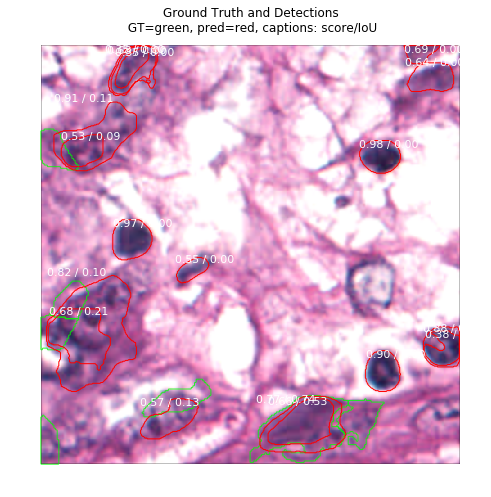

image ID: nucleus.TCGA-A2-A1G6-DX1_xmin57706_ymin69514__rowmin1024_rowmax1280_colmin0_colmax256 (24992) TCGA-A2-A1G6-DX1_xmin57706_ymin69514__rowmin1024_rowmax1280_colmin0_colmax256
Processing 1 images
image                    shape: (512, 512, 3)         min:    6.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    6.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 24992.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


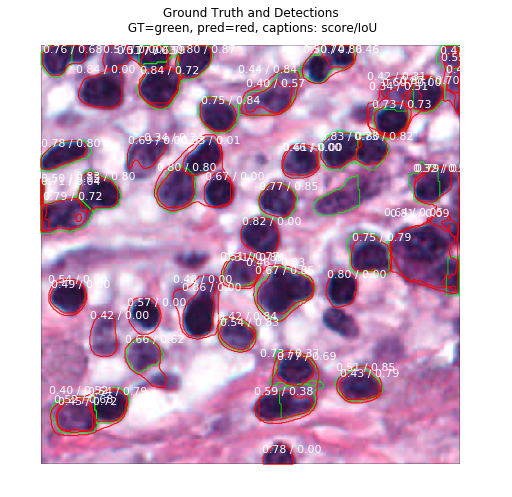

image ID: nucleus.TCGA-E2-A14X-DX1_xmin88836_ymin66393__rowmin1408_rowmax1664_colmin3200_colmax3456 (67794) TCGA-E2-A14X-DX1_xmin88836_ymin66393__rowmin1408_rowmax1664_colmin3200_colmax3456
Processing 1 images
image                    shape: (512, 512, 3)         min:    6.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    6.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 67794.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


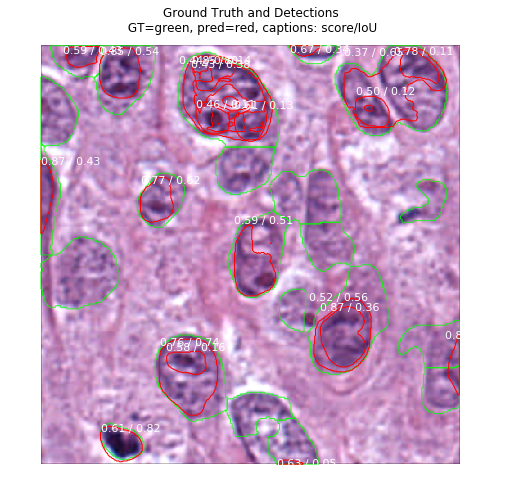

image ID: nucleus.TCGA-D8-A147-DX1_xmin66394_ymin19298__rowmin1152_rowmax1408_colmin1408_colmax1664 (14758) TCGA-D8-A147-DX1_xmin66394_ymin19298__rowmin1152_rowmax1408_colmin1408_colmax1664
Processing 1 images
image                    shape: (512, 512, 3)         min:   13.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   13.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 14758.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


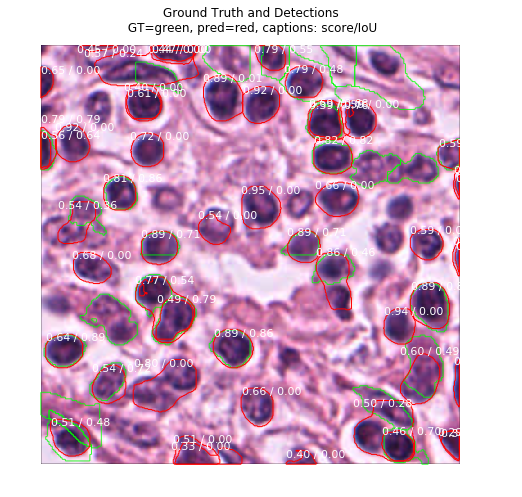

image ID: nucleus.TCGA-AR-A0TU-DX1_xmin88352_ymin23098__rowmin256_rowmax512_colmin2048_colmax2304 (37961) TCGA-AR-A0TU-DX1_xmin88352_ymin23098__rowmin256_rowmax512_colmin2048_colmax2304
Processing 1 images
image                    shape: (512, 512, 3)         min:    7.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    7.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 37961.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


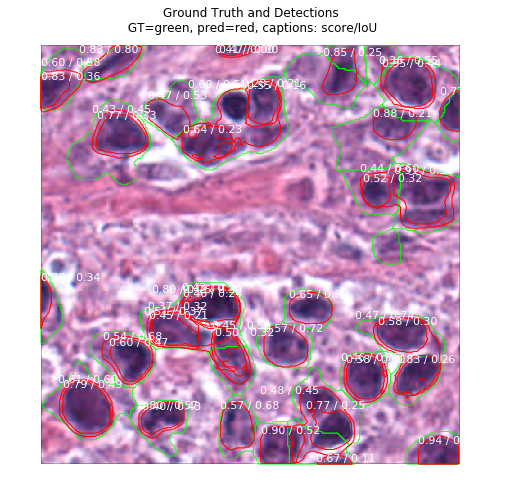

image ID: nucleus.TCGA-A2-A0D0-DX1_xmin68482_ymin39071__rowmin4992_rowmax5248_colmin5376_colmax5632 (6378) TCGA-A2-A0D0-DX1_xmin68482_ymin39071__rowmin4992_rowmax5248_colmin5376_colmax5632
Processing 1 images
image                    shape: (512, 512, 3)         min:   24.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   24.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 6378.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


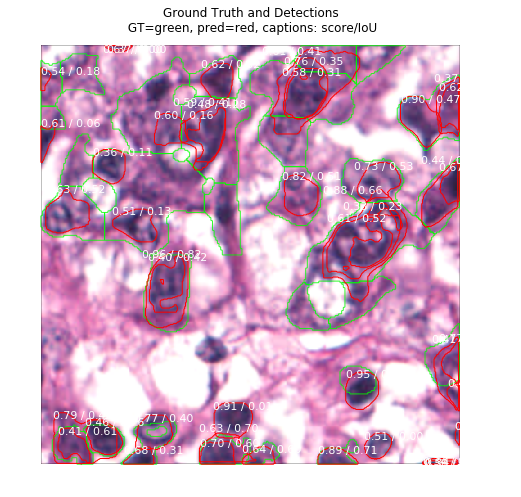

image ID: nucleus.TCGA-E2-A1AZ-DX1_xmin50286_ymin17075__rowmin3072_rowmax3328_colmin1792_colmax2048 (23214) TCGA-E2-A1AZ-DX1_xmin50286_ymin17075__rowmin3072_rowmax3328_colmin1792_colmax2048
Processing 1 images
image                    shape: (512, 512, 3)         min:    8.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    8.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 23214.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


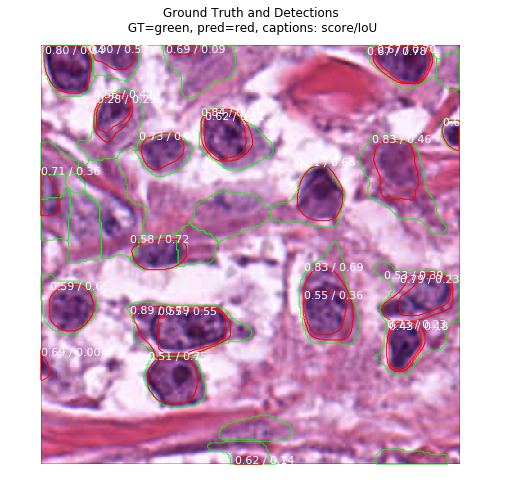

image ID: nucleus.TCGA-A2-A3XS-DX1_xmin21421_ymin37486__rowmin1792_rowmax2048_colmin5376_colmax5632 (32448) TCGA-A2-A3XS-DX1_xmin21421_ymin37486__rowmin1792_rowmax2048_colmin5376_colmax5632
Processing 1 images
image                    shape: (512, 512, 3)         min:    7.00000  max:  253.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    7.00000  max:  253.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 32448.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


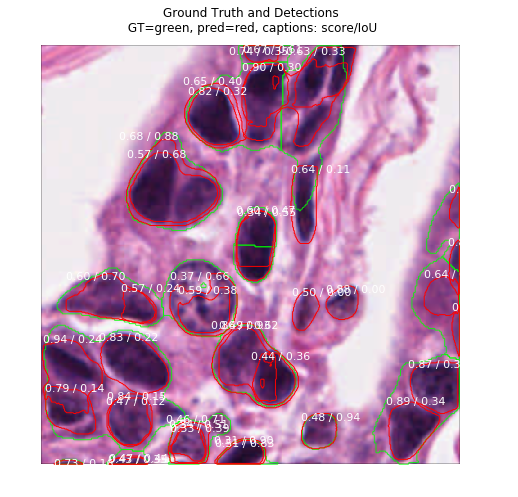

image ID: nucleus.TCGA-GM-A2DH-DX1_xmin50963_ymin56303__rowmin2560_rowmax2816_colmin3584_colmax3840 (71079) TCGA-GM-A2DH-DX1_xmin50963_ymin56303__rowmin2560_rowmax2816_colmin3584_colmax3840
Processing 1 images
image                    shape: (512, 512, 3)         min:   13.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   13.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 71079.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


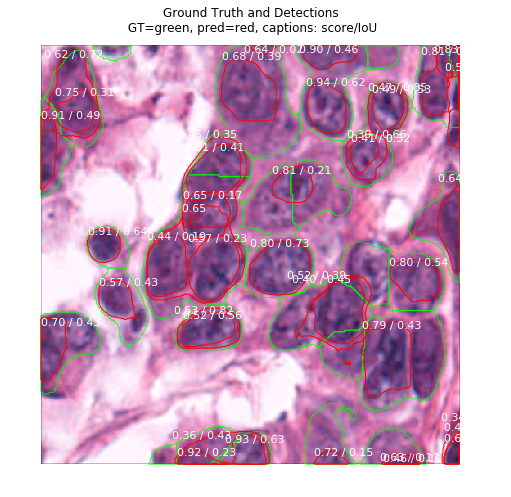

image ID: nucleus.TCGA-BH-A0WA-DX1_xmin56581_ymin24774__rowmin3584_rowmax3840_colmin1792_colmax2048 (33136) TCGA-BH-A0WA-DX1_xmin56581_ymin24774__rowmin3584_rowmax3840_colmin1792_colmax2048
Processing 1 images
image                    shape: (512, 512, 3)         min:   18.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   18.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 33136.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


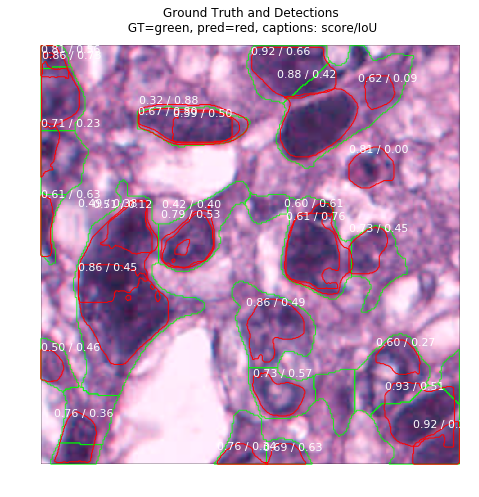

In [11]:
#%% =================================================================
# Run Detection
#=================================================================

# dataset = dataset_val
dataset = dataset_train

for i in range(10):
    
    image_id = random.choice(dataset.image_ids)
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                           dataset.image_reference(image_id)))
    
    if i == 0:
        print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

    # Run object detection
    results = model.detect_molded(np.expand_dims(image, 0), np.expand_dims(image_meta, 0), verbose=1)

   
    # Display results
    r = results[0]
    if i == 0:
        log("gt_class_id", gt_class_id)
        log("gt_bbox", gt_bbox)
        log("gt_mask", gt_mask)

        # Compute AP over range 0.5 to 0.95 and print it
        utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask,
                               r['rois'], r['class_ids'], r['scores'], r['masks'],
                               verbose=1)

    visualize.display_differences(
        image,
        gt_bbox, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        dataset.class_names, ax=get_ax(),
        show_box=False, show_mask=False,
        iou_threshold=0.5, score_threshold=0.5)
    plt.show()

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


Processing 1 images
image                    shape: (512, 512, 3)         min:   23.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   23.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 5601.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


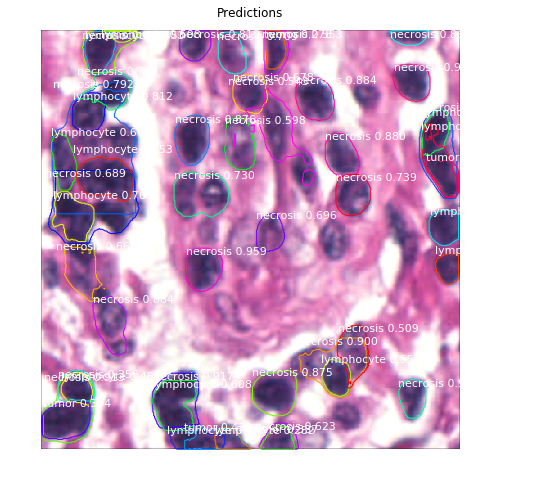

Processing 1 images
image                    shape: (512, 512, 3)         min:   10.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   10.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 28729.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


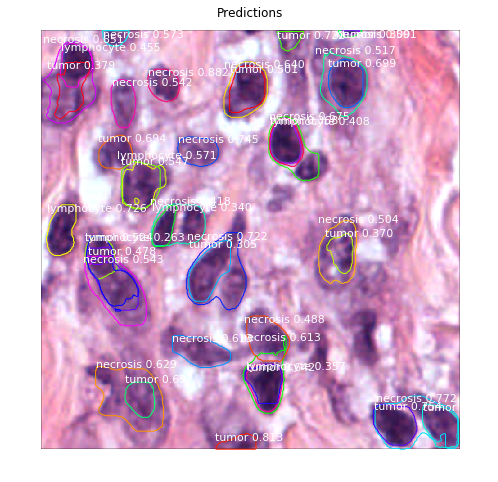

Processing 1 images
image                    shape: (512, 512, 3)         min:   12.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   12.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 89198.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


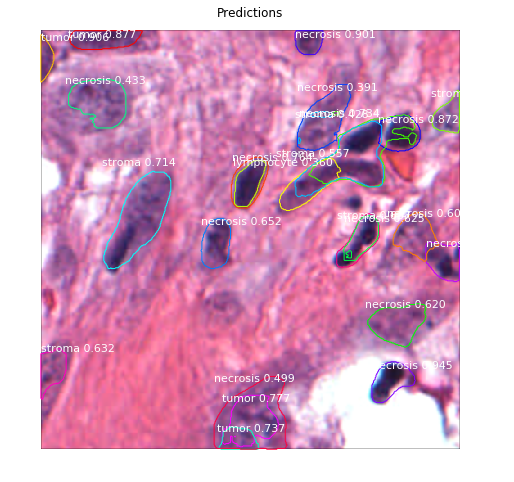

Processing 1 images
image                    shape: (512, 512, 3)         min:   29.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   29.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 35088.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


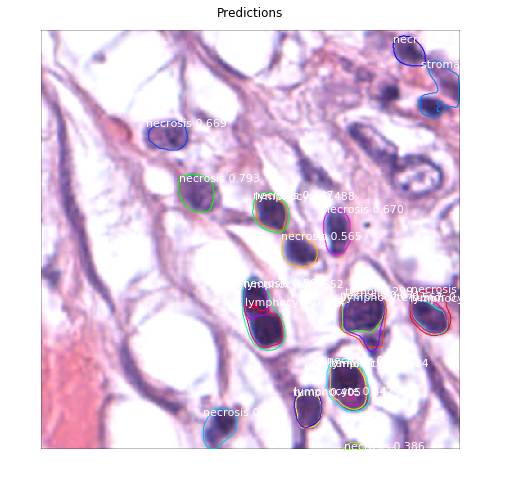

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    1.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 68815.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


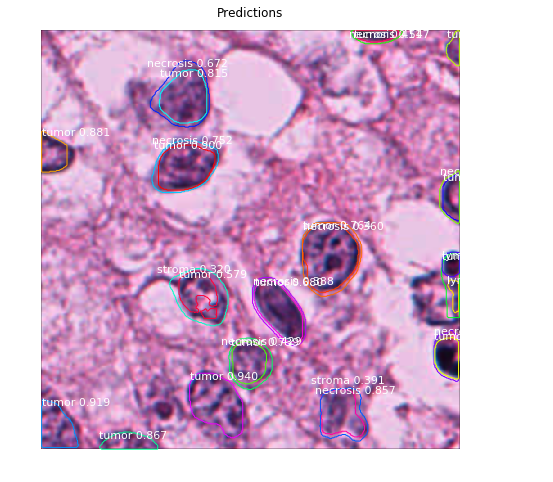

Processing 1 images
image                    shape: (512, 512, 3)         min:    4.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    4.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 5160.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


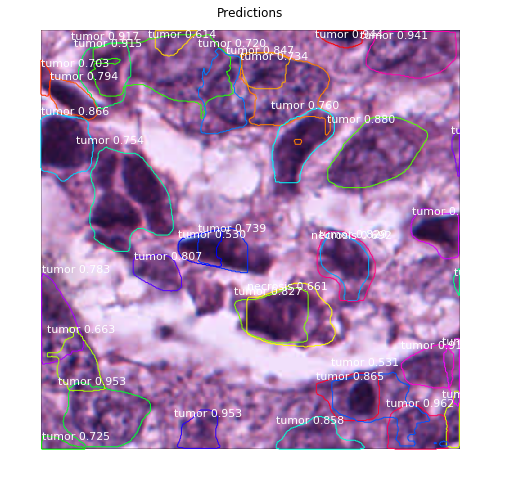

Processing 1 images
image                    shape: (512, 512, 3)         min:   23.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   23.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max:  785.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


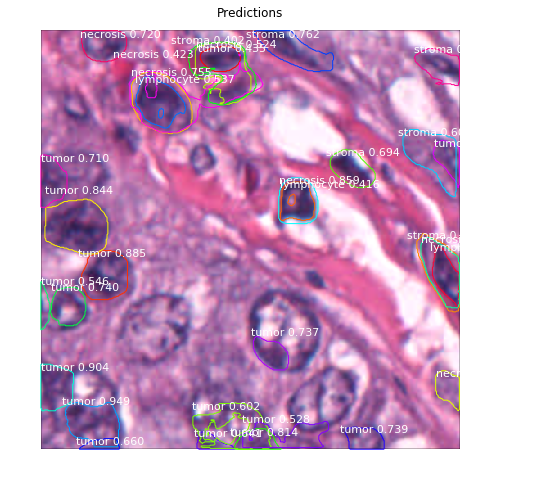

Processing 1 images
image                    shape: (512, 512, 3)         min:   35.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   35.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 50879.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


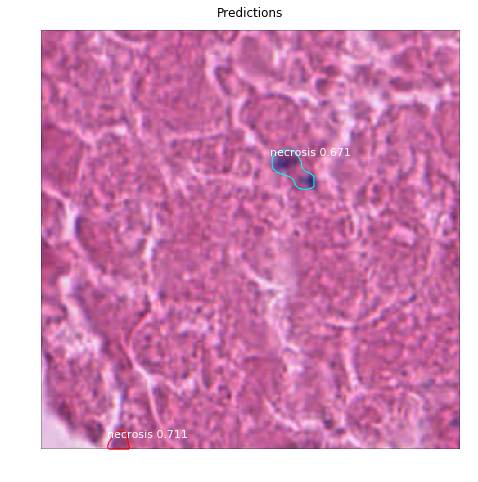

Processing 1 images
image                    shape: (512, 512, 3)         min:   10.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   10.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 61032.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


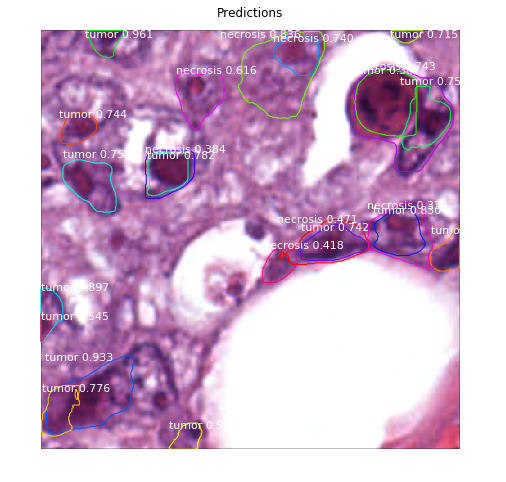

Processing 1 images
image                    shape: (512, 512, 3)         min:   14.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   14.00000  max:  255.00000  uint8
image_metas              shape: (1, 20)               min:    0.00000  max: 77996.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


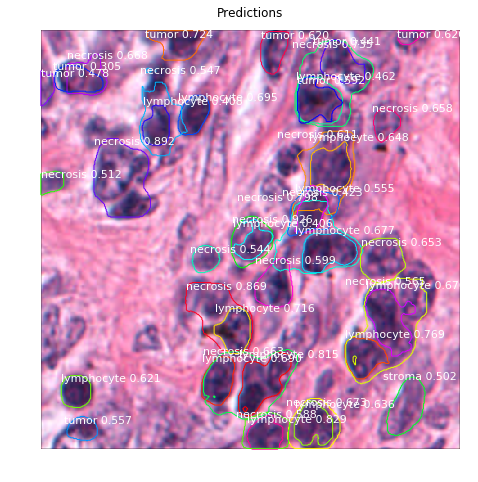

In [19]:
#%% =================================================================
# Display predictions only
#=================================================================

# dataset = dataset_val
dataset = dataset_train

for i in range(10):
    
    image_id = random.choice(dataset.image_ids)
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    
    # Run object detection
    r = model.detect_molded(np.expand_dims(image, 0), np.expand_dims(image_meta, 0), verbose=1)[0]

    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset_val.class_names, r['scores'], ax=get_ax(1),
                                show_bbox=False, show_mask=False,
                                title="Predictions")
    plt.show()

In [13]:
#%% =================================================================
# Compute AP on batch of images
#=================================================================

def compute_batch_ap(dataset, image_ids, verbose=1):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect_molded(image[np.newaxis], image_meta[np.newaxis], verbose=0)
        # Compute AP over range 0.5 to 0.95
        r = results[0]
        ap = utils.compute_ap_range(
            gt_bbox, gt_class_id, gt_mask,
            r['rois'], r['class_ids'], r['scores'], r['masks'],
            verbose=0)
        APs.append(ap)
        if verbose:
            info = dataset.image_info[image_id]
            meta = modellib.parse_image_meta(image_meta[np.newaxis,...])
            print("{:3} {}   AP: {:.2f}".format(
                meta["image_id"][0], meta["original_image_shape"][0], ap))
    return APs

# Run on validation set
limit = 5
APs = compute_batch_ap(dataset_val, dataset_val.image_ids[:limit])
print("Mean AP overa {} images: {:.4f}".format(len(APs), np.mean(APs)))

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


  0 [256 256   3]   AP: 0.03


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


  1 [256 256   3]   AP: 0.06


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


  2 [256 256   3]   AP: 0.00


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


  3 [256 256   3]   AP: 0.33


/home/mohamedt/.conda/envs/maskrcnn/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


  4 [256 256   3]   AP: 0.07
Mean AP overa 5 images: 0.0975


In [16]:
print(r)

{'class_ids': array([1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 1, 1, 3], dtype=int32), 'scores': array([0.7826902 , 0.76985234, 0.7547314 , 0.71618325, 0.69988227,
       0.6964533 , 0.60084075, 0.5515367 , 0.5483787 , 0.52139497,
       0.5030552 , 0.4157393 , 0.41351265], dtype=float32), 'masks': array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

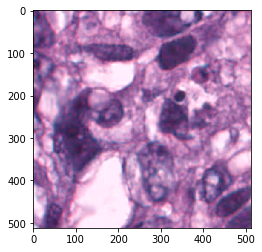

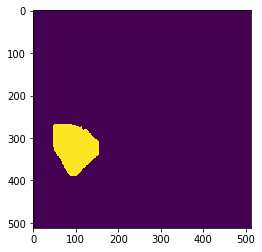

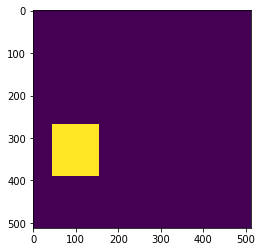

In [16]:
instanceidx = 6

plt.imshow(image); plt.show()

plt.imshow(r['masks'][..., instanceidx]); plt.show()

bound_box = np.zeros(r['masks'].shape[:2])
rmin, cmin, rmax, cmax = r['rois'][instanceidx]
bound_box[rmin:rmax, cmin:cmax] = 1
plt.imshow(bound_box); plt.show()

In [20]:
r['masks'].shape

(512, 512, 13)